In [5]:
pip install client

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement client (from versions: none)
ERROR: No matching distribution found for client


In [2]:
import pathlib
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
from scipy.stats import norm
%matplotlib inline
import yfinance as yf
import seaborn as sns

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/yfinance/base.py:48: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  _empty_series = pd.Series()


In [3]:
# Define the ticker symbols for the companies
tickers = ['WMT', 'AMZN', 'META', 'SPG','NVDA','^GSPC']

companies =  yf.download(tickers, period= '5y')

[*********************100%%**********************]  6 of 6 completed


In [5]:
df_closingPrice = companies['Adj Close']

In [6]:
corr_df = df_closingPrice.corr()

In [7]:
df_closingPrice['SPG']

Date
2019-04-16    132.793320
2019-04-17    133.063278
2019-04-18    133.528183
2019-04-22    130.266159
2019-04-23    132.440842
                 ...    
2024-04-09    150.190002
2024-04-10    145.550003
2024-04-11    146.860001
2024-04-12    144.809998
2024-04-15    142.389999
Name: SPG, Length: 1258, dtype: float64

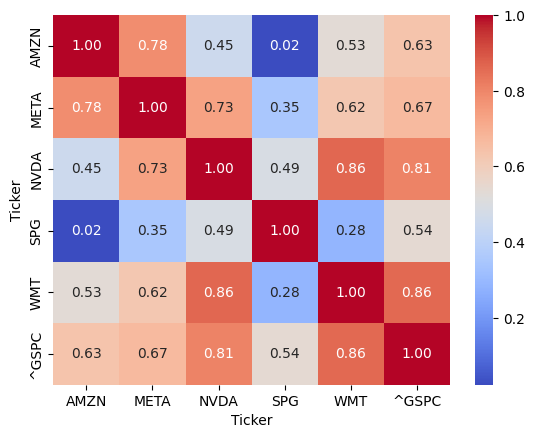

In [8]:
sns.heatmap(corr_df, annot=True, fmt=".2f", cmap='coolwarm')
plt.show()

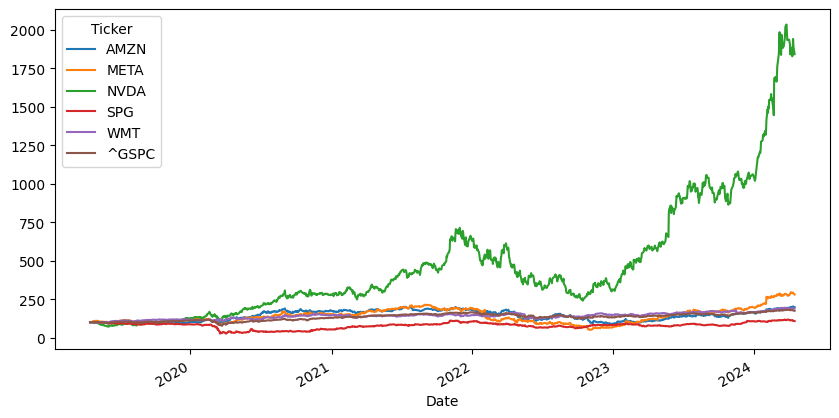

In [9]:
(df_closingPrice/ df_closingPrice.iloc[0] * 100).plot(figsize=(10, 5))
plt.show()

In [10]:
def returns(dataframe):
    log_returns = np.log(dataframe/dataframe.shift(1))
    return log_returns

In [11]:
log_returns = returns(df_closingPrice)

In [12]:
log_returns_noSP  = log_returns.drop(columns = ['^GSPC']) 

In [13]:
log_returns_noSP

Ticker,AMZN,META,NVDA,SPG,WMT
Date,,,,,
2019-04-16,NaN,NaN,NaN,NaN,NaN
2019-04-17,0.000955,-0.000503,-0.004900,0.002031,0.002232
2019-04-18,-0.001680,-0.002801,-0.005300,0.003488,0.000194
2019-04-22,0.013668,0.017570,0.011581,-0.024733,-0.007881
2019-04-23,0.019134,0.012814,0.011605,0.016556,0.006814
...,...,...,...,...,...
2024-04-09,0.002589,-0.004536,-0.020628,-0.001131,0.000167
2024-04-10,0.001507,0.005652,0.019549,-0.031381,0.013786
2024-04-11,0.016534,0.006385,0.040274,0.008960,-0.008781


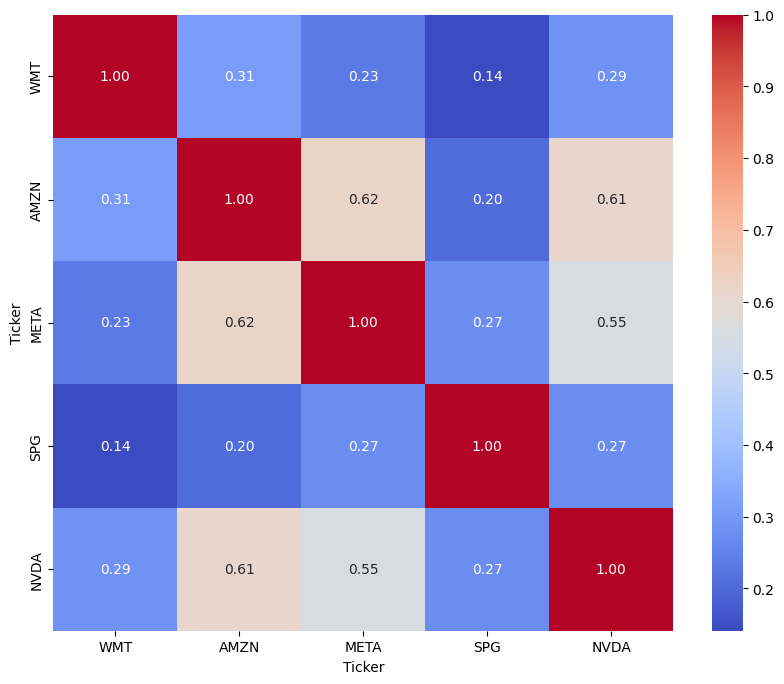

In [14]:
correlation_matrix = log_returns[['WMT', 'AMZN', 'META', 'SPG','NVDA']].corr()

# Now you can create a heatmap using seaborn
plt.figure(figsize=(10, 8))  # Adjust the size as needed
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.show()

In [15]:
u = log_returns_noSP.mean()

In [16]:
cov = log_returns_noSP.cov()
cov

Ticker,AMZN,META,NVDA,SPG,WMT
Ticker,,,,,
AMZN,0.000489,0.000387,0.000437,0.000136,0.000094
META,0.000387,0.000799,0.000506,0.000234,0.000092
NVDA,0.000437,0.000506,0.001050,0.000271,0.000129
SPG,0.000136,0.000234,0.000271,0.000927,0.000060
WMT,0.000094,0.000092,0.000129,0.000060,0.000194


In [17]:
var = log_returns_noSP.var()
var

Ticker
AMZN    0.000489
META    0.000799
NVDA    0.001050
SPG     0.000927
WMT     0.000194
dtype: float64

In [18]:
drift = u - (.5*var)
drift

Ticker
AMZN    0.000295
META    0.000419
NVDA    0.001792
SPG    -0.000408
WMT     0.000412
dtype: float64

In [19]:
stdev = log_returns_noSP.std()
stdev

Ticker
AMZN    0.022112
META    0.028266
NVDA    0.032403
SPG     0.030453
WMT     0.013910
dtype: float64

In [20]:
x = np.random.rand(250,1000)
x

array([[0.90422794, 0.25927292, 0.44269672, ..., 0.1690946 , 0.97095211,
        0.14792648],
       [0.02863711, 0.07740792, 0.21125462, ..., 0.42129455, 0.98242717,
        0.76720636],
       [0.64928466, 0.91758054, 0.9194717 , ..., 0.50476165, 0.40234782,
        0.01293598],
       ...,
       [0.17662193, 0.44685344, 0.26932707, ..., 0.15989572, 0.81577423,
        0.4042588 ],
       [0.00641611, 0.03269281, 0.53416057, ..., 0.20365036, 0.8757851 ,
        0.32666667],
       [0.67746299, 0.37446042, 0.78534845, ..., 0.8630326 , 0.93556871,
        0.19933921]])

In [21]:
Z = norm.ppf(x)
Z

array([[ 1.30602484, -0.64558859, -0.14413555, ..., -0.95774929,
         1.89497452, -1.04536791],
       [-1.90121223, -1.42272514, -0.80207559, ..., -0.19858281,
         2.10667605,  0.72967761],
       [ 0.38338992,  1.38897971,  1.40152679, ...,  0.01193597,
        -0.24727469, -2.22812826],
       ...,
       [-0.92831565, -0.13361517, -0.61484946, ..., -0.99488655,
         0.89937765, -0.24233888],
       [-2.48839212, -1.84261239,  0.08573275, ..., -0.82865312,
         1.15417167, -0.44913629],
       [ 0.46061615, -0.32006264,  0.79038476, ...,  1.09404603,
         1.51860249, -0.84398385]])

In [22]:
num_assets = len(tickers)
num_assets = num_assets-1
num_assets

5

In [23]:
weights = np.random.random(num_assets)
weights /= np.sum(weights)
weights

array([0.01933286, 0.2353106 , 0.26533893, 0.317569  , 0.16244861])

## Expected Portfolio Return

In [24]:
np.sum(weights * log_returns_noSP.mean()) * 250

0.2295363896443444

## Expected Portfolio Variance

In [25]:
np.dot(weights.T, 
       np.dot(log_returns_noSP.cov() * 250, weights))

0.09885007217181446

In [26]:
#Expected Portfolio Volatility:
np.sqrt(np.dot(weights.T,np.dot(log_returns_noSP.cov() * 250, weights)))

0.31440431322075474

In [27]:
pf_returns = []
pf_volatilities = []
pf_weights = []

In [28]:
for x in range (1000):
    weights = np.random.random(num_assets)
    weights /= np.sum(weights)
    pf_weights.append(weights)
    pf_returns.append(np.sum(weights * log_returns_noSP.mean()) * 250)
    pf_volatilities.append(np.sqrt(np.dot(weights.T,np.dot(log_returns_noSP.cov() * 250, weights))))
    
pf_returns, pf_volatilities, pf_weights

([0.2193932800890087,
  0.22890942450733393,
  0.32658102851153314,
  0.2018398269531294,
  0.2508146150423938,
  0.13528823096886713,
  0.238312129446054,
  0.21602983619789512,
  0.33618000020811156,
  0.08982637925989555,
  0.184779007200225,
  0.23300610562139734,
  0.14250631089427818,
  0.12710616456691948,
  0.17583272173694564,
  0.2323790421339998,
  0.2499042889139744,
  0.32733081313992196,
  0.23918228861469135,
  0.1661900130707226,
  0.33100508115227767,
  0.22846077260657363,
  0.25480351627485126,
  0.2848505328139159,
  0.22064333625865293,
  0.24907801505945434,
  0.2610609677757911,
  0.1297573217436237,
  0.2141822088717369,
  0.18960686257085443,
  0.19046153786058523,
  0.11332961590304261,
  0.1666714929258115,
  0.2890230523038145,
  0.21807706174788508,
  0.15222781053789367,
  0.2275051829588858,
  0.1653237619767415,
  0.13684929805525492,
  0.2507807266357798,
  0.16245819777183565,
  0.22594586828537416,
  0.21338223188068453,
  0.19653921823219644,
  0.116

In [29]:
pf_returns = np.array(pf_returns)
pf_volatilities = np.array(pf_volatilities)
pf_weights = np.array(pf_weights)

pf_returns, pf_volatilities, pf_weights

(array([0.21939328, 0.22890942, 0.32658103, 0.20183983, 0.25081462,
        0.13528823, 0.23831213, 0.21602984, 0.33618   , 0.08982638,
        0.18477901, 0.23300611, 0.14250631, 0.12710616, 0.17583272,
        0.23237904, 0.24990429, 0.32733081, 0.23918229, 0.16619001,
        0.33100508, 0.22846077, 0.25480352, 0.28485053, 0.22064334,
        0.24907802, 0.26106097, 0.12975732, 0.21418221, 0.18960686,
        0.19046154, 0.11332962, 0.16667149, 0.28902305, 0.21807706,
        0.15222781, 0.22750518, 0.16532376, 0.1368493 , 0.25078073,
        0.1624582 , 0.22594587, 0.21338223, 0.19653922, 0.11638129,
        0.21540908, 0.20345982, 0.12652898, 0.21684451, 0.13747911,
        0.28011064, 0.22201598, 0.17184649, 0.27989217, 0.35599662,
        0.2521131 , 0.29886337, 0.19951179, 0.21518901, 0.14368277,
        0.22915383, 0.20390199, 0.23555037, 0.21058715, 0.27623453,
        0.1677943 , 0.22303468, 0.20913101, 0.19892849, 0.24109255,
        0.22168109, 0.16847479, 0.17153159, 0.14

In [30]:
portfolios = ({'Return': pf_returns, 'Volatility': pf_volatilities})

for counter, symbol in enumerate(log_returns_noSP.columns.tolist()):
    #print(counter, symbol)
    portfolios[symbol+' weight'] = [w[counter] for w in pf_weights]

In [31]:
portfolios = pd.DataFrame(portfolios)

In [32]:
portfolios

,Return,Volatility,AMZN weight,META weight,NVDA weight,SPG weight,WMT weight
0,0.219393,0.324507,0.299533,0.170340,0.238015,0.273002,0.019110
1,0.228909,0.289511,0.050169,0.221801,0.245182,0.235463,0.247385
2,0.326581,0.347383,0.163514,0.148655,0.448656,0.143150,0.096024
3,0.201840,0.278863,0.245003,0.242387,0.152596,0.132474,0.227540
4,0.250815,0.341659,0.199475,0.126422,0.331046,0.329931,0.013126
...,...,...,...,...,...,...,...
995,0.159533,0.324507,0.306666,0.359138,0.069527,0.258815,0.005853
996,0.199775,0.277802,0.216986,0.059756,0.215859,0.276152,0.231247
997,0.158710,0.255187,0.176027,0.268075,0.063162,0.169036,0.323700
998,0.163502,0.320577,0.198483,0.042380,0.187919,0.471783,0.099436


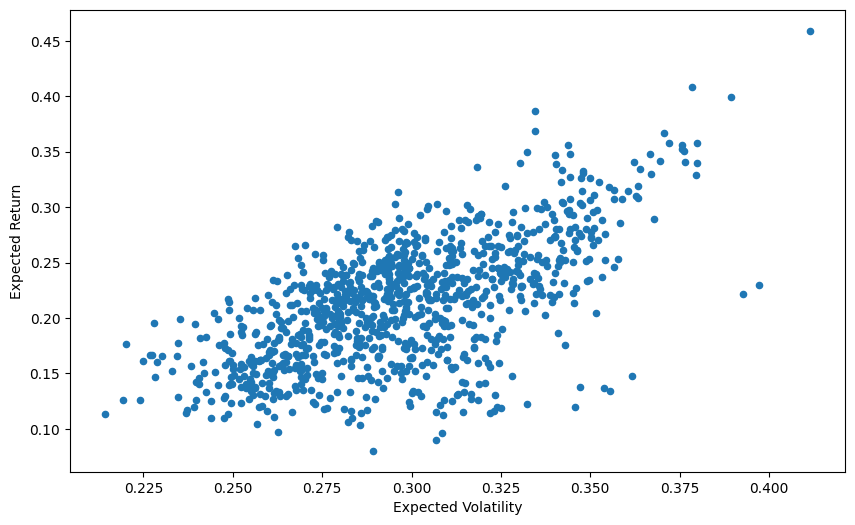

In [33]:
portfolios.plot(x='Volatility', y='Return', kind='scatter', figsize=(10, 6));
plt.xlabel('Expected Volatility')
plt.ylabel('Expected Return')
plt.show()

In [34]:
import plotly.express as px
fig = px.scatter(portfolios,x='Volatility', y='Return')
fig.show()

In [35]:
min_vol_port = portfolios.iloc[portfolios['Volatility'].idxmin()]
# idxmin() gives us the minimum value in the column specified.                               
min_vol_port

Return         0.113330
Volatility     0.214301
AMZN weight    0.104705
META weight    0.057854
NVDA weight    0.015614
SPG weight     0.230759
WMT weight     0.591067
Name: 31, dtype: float64

In [36]:
max_vol_port = portfolios.iloc[portfolios['Return'].idxmax()]
# idxmin() gives us the minimum value in the column specified.                               
max_vol_port

Return         0.459158
Volatility     0.411448
AMZN weight    0.026799
META weight    0.084126
NVDA weight    0.722839
SPG weight     0.013389
WMT weight     0.152847
Name: 953, dtype: float64

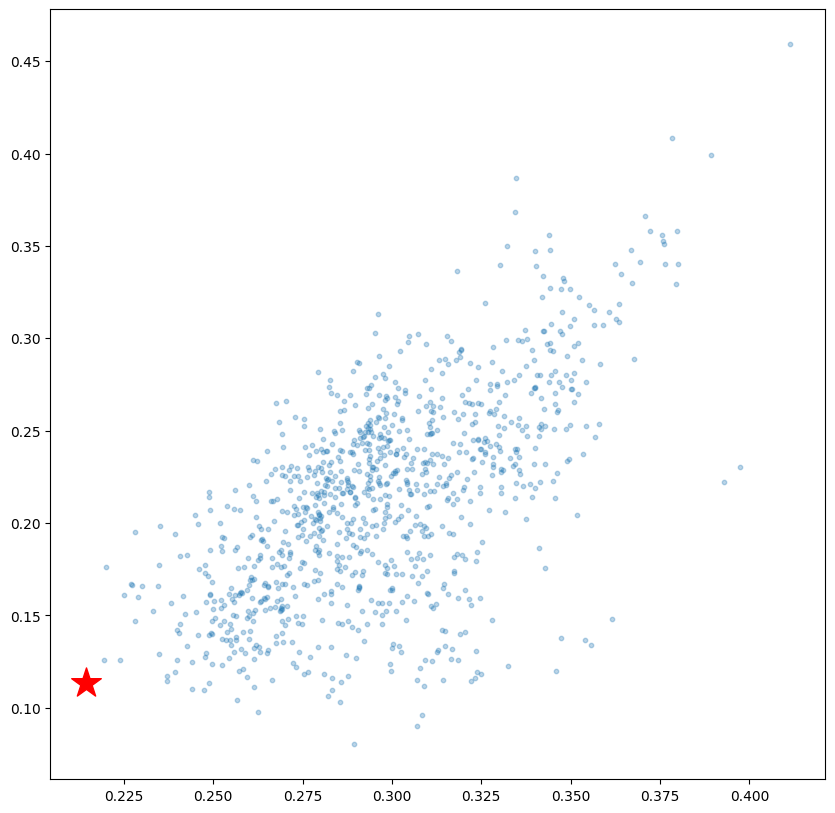

In [37]:
# plotting the minimum volatility portfolio
plt.subplots(figsize=[10,10])
plt.scatter(portfolios['Volatility'], portfolios['Return'],marker='o', s=10, alpha=0.3)
plt.scatter(min_vol_port[1], min_vol_port[0], color='r', marker='*', s=500)
plt.show()

In [49]:
# Finding the optimal portfolio - Sharpe Ratio
rf = 0.01 # risk factor
optimal_risky_port = portfolios.iloc[((portfolios['Return']-rf)/portfolios['Volatility']).idxmax()]
optimal_risky_port *100

Return         38.681235
Volatility     33.460646
AMZN weight     0.570454
META weight     0.971470
NVDA weight    57.279769
SPG weight      0.058852
WMT weight     41.119454
Name: 586, dtype: float64

In [39]:
def monte_carlo(colname, t_intervals, iterations, data):
    u = log_returns[colname].mean()
    var = log_returns[colname].var()
    stdev = log_returns[colname].std()
    drift = u - (.5*var)
    
    # Initial stock price for the given stock symbol
    S0 = data[colname].iloc[-1]

    # Prepare a two-dimensional array to hold the simulation results
    price_list = np.zeros((t_intervals, iterations))

    # Set the initial price for all iterations
    price_list[0] = S0

    # Run the simulation for each iteration
    for i in range(iterations):
        # Generate random daily returns using the drift and volatility (stdev)
        Z = np.random.standard_normal(t_intervals)  # Random shock from a standard normal distribution
        daily_returns = np.exp(drift + stdev * Z)

        # Calculate the price path for each iteration
        for t in range(1, t_intervals):
            price_list[t, i] = price_list[t - 1, i] * daily_returns[t]
    mean_price_list = price_list.mean(axis=1)

            

    # Plotting the simulation results
    plt.figure(figsize=(14, 7))
    plt.plot(price_list, lw=1)  # Set alpha to 1 for opaque lines
    plt.title(f'{iterations} Simulated Stock Price Paths for {colname} over {t_intervals} Days')
    plt.xlabel('Days into the Future')
    plt.ylabel('Stock Price')
    plt.show()

    # Optionally, print the overall mean of the mean price list for a single representative value
    overall_mean_price = np.mean(mean_price_list)
    print("Overall mean price across all time steps and simulations:", overall_mean_price)

    

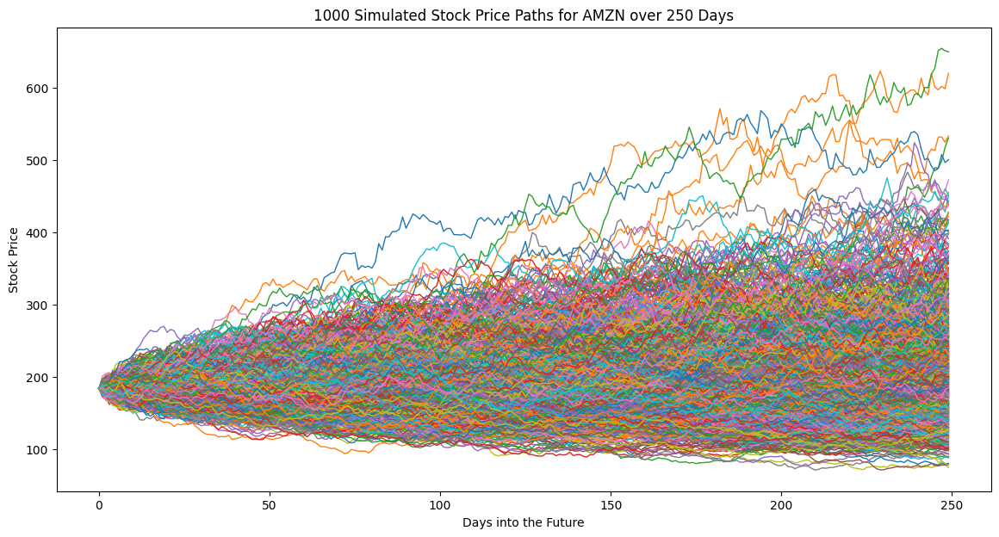

Overall mean price across all time steps and simulations: 198.94277933728048


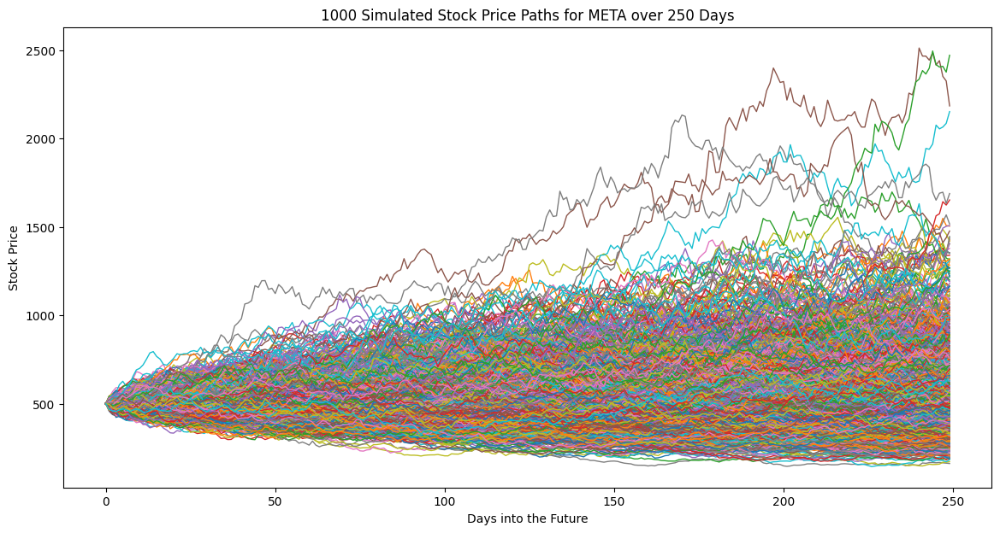

Overall mean price across all time steps and simulations: 548.6954984431502


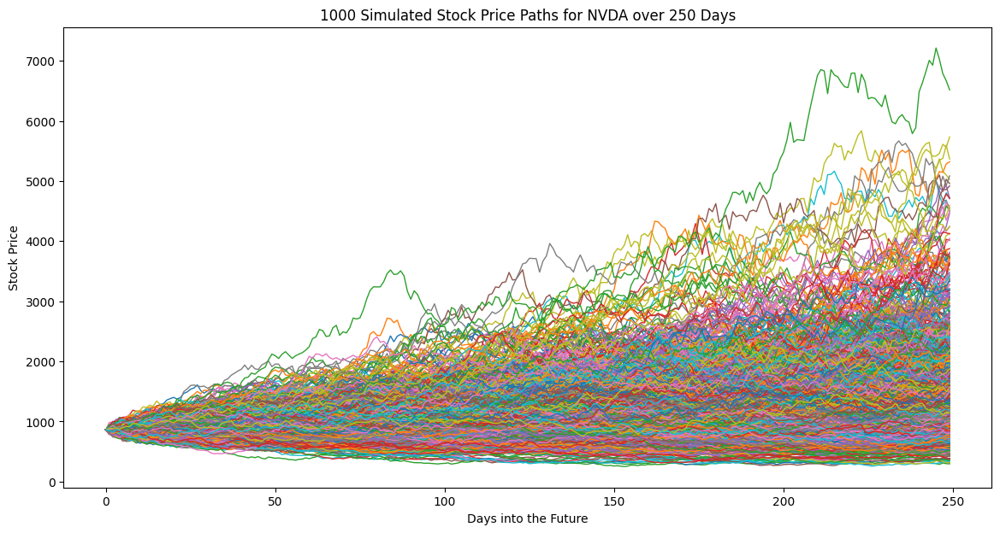

Overall mean price across all time steps and simulations: 1175.505294157025


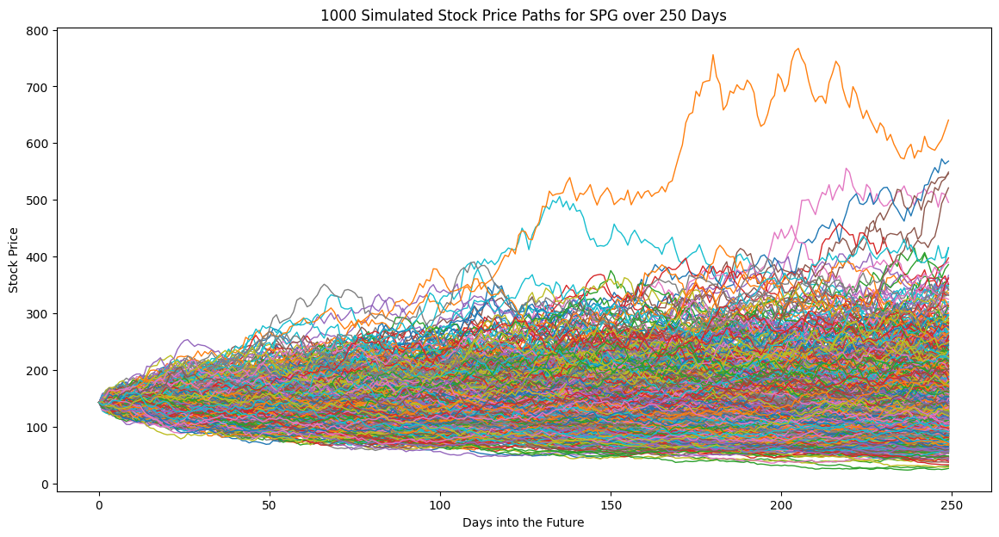

Overall mean price across all time steps and simulations: 144.36721030564814


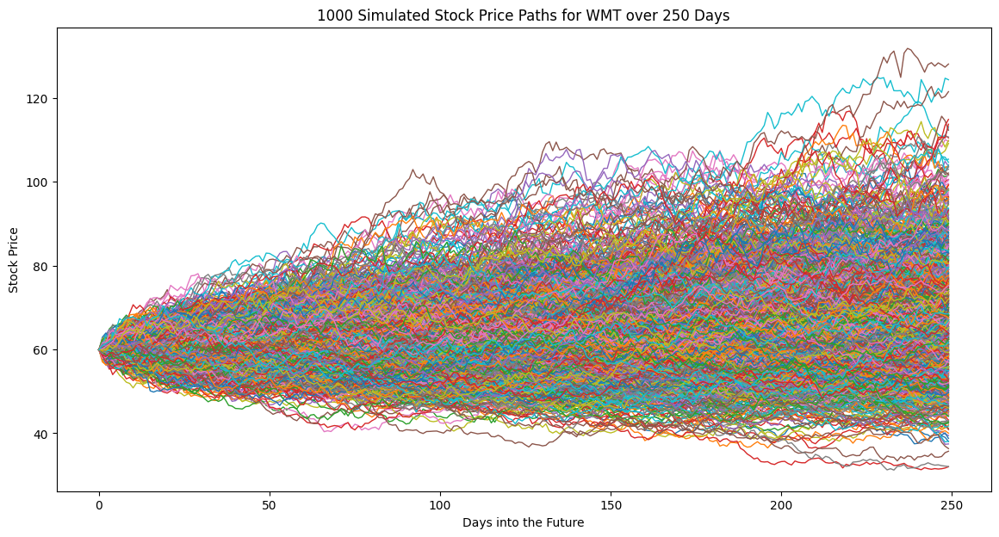

Overall mean price across all time steps and simulations: 64.06055937421736


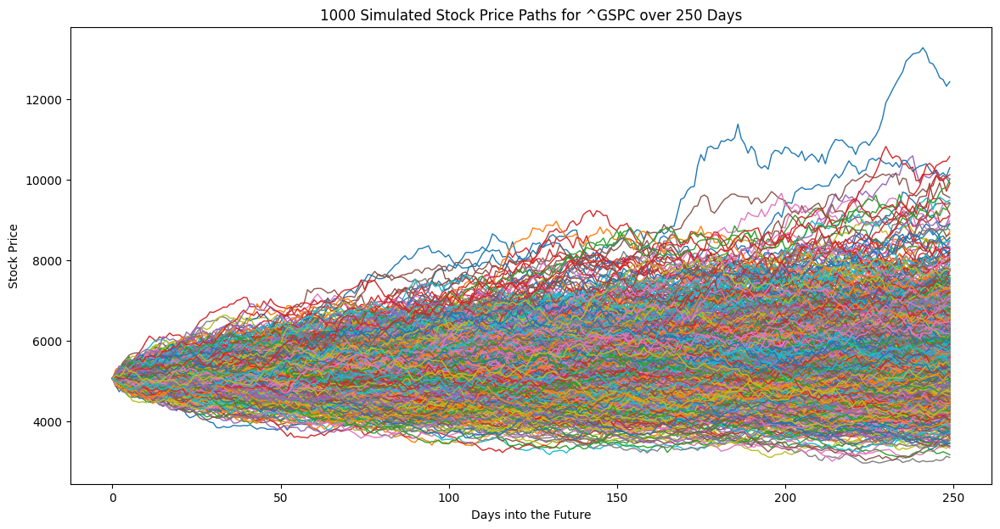

Overall mean price across all time steps and simulations: 5368.945607394287


In [40]:
for col in df_closingPrice.columns:
    monte_carlo(col, 250, 1000, df_closingPrice)

In [42]:
average_daily_log_return_sp500 = log_returns['^GSPC'].mean()
average_daily_return_sp500 = np.exp(average_daily_log_return_sp500) - 1
market_return = (average_daily_return_sp500 + 1) ** 252 - 1

print(f"Estimated annual market return: {market_return * 100:.2f}%")

Estimated annual market return: 11.76%


In [43]:
risk_free_rate = 0.01
market_var= log_returns['^GSPC'].var()
betas = {}
for ticker in tickers[:-1]:  # Exclude '^GSPC' which is the market index itself
    cov_with_market = log_returns[ticker].cov(log_returns['^GSPC'])
    betas[ticker] = cov_with_market / market_var

# Calculate expected returns using CAPM formula
expected_returns = {}
for ticker, beta in betas.items():
    expected_returns[ticker] = risk_free_rate + beta * (market_return - risk_free_rate)

# Print expected returns
for ticker, exp_return in expected_returns.items():
    print(f"The expected return for {ticker} using CAPM is: {exp_return*100:.2f}%")

The expected return for WMT using CAPM is: 6.13%
The expected return for AMZN using CAPM is: 12.43%
The expected return for META using CAPM is: 15.06%
The expected return for SPG using CAPM is: 15.31%
The expected return for NVDA using CAPM is: 19.56%


In [44]:
expected_return = risk_free_rate + beta*(market_return - risk_free_rate)

In [45]:
expected_return*100

19.563627888447044